In [1]:
import scipy.misc
import numpy as np
import tensorflow as tf
import IPython.display
import PIL.Image
from cStringIO import StringIO
from datetime import datetime

In [2]:
#!wget -O - http://www.cs.toronto.edu/~frossard/vgg16/vgg16_weights.npz > vgg16_weights.npz 

In [3]:
import vgg16
network_model = vgg16

In [4]:
content_layer = network_model.content_layers()
style_layer = network_model.style_layers()

In [5]:
iterations=1000
content_weight = 1e0
style_weight = 1e3
tv_weight = 0
learning_rate = 1e0
style_weight_layer = style_weight / len(style_layer)

In [6]:
style_image = 'styles/starry-night.jpg'
content_image = 'inputs/london.jpg'

In [7]:
def display_array(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

In [8]:
def load_image(img_path, new_size=None):
    loaded = scipy.misc.imread(img_path).astype(np.float)

    # grayscale to rgb
    if len(loaded.shape) == 2:
        loaded = np.dstack([loaded, loaded, loaded])

    # rescale if needed
    if new_size:
        h,w,c = loaded.shape
        if h > w:
            ratio = w/float(h)
            shape = (new_size, int(new_size*ratio))
        else:
            ratio = h/float(w)
            shape = (int(new_size*ratio), new_size)
        loaded = scipy.misc.imresize(loaded, shape)

    return loaded

In [9]:
def get_name(image):
    return image.split('/')[1].split('.')[0]

out_image_name = get_name(content_image)+'_'+get_name(style_image)+'_style.jpg'
print(out_image_name)

london_starry-night_style.jpg


In [10]:
def content_loss(cont_out, target_out, layer, content_weight):
    '''
        # content loss is just the mean square error between the outputs of a given layer
        # in the content image and the target image
    '''
    cont_loss = tf.reduce_sum(tf.square(tf.subtract(target_out[layer], cont_out)))

    # multiply the loss by it's weight
    cont_loss = tf.multiply(cont_loss, content_weight, name="cont_loss")

    return cont_loss

In [11]:
def get_shape(inp):
    # returns the shape of a tensor or an array
    if type(inp) == type(np.array([])):
        return inp.shape
    else:
        return [i.value for i in inp.get_shape()]

In [12]:
def style_loss(style_out, target_out, layers, style_weight_layer):

    def style_layer_loss(style_out, target_out, layer):
        '''
            # returns the style loss for a given layer between
            # the style image and the target image
        '''
        def gram_matrix(activation):
            flat = tf.reshape(activation, [-1, get_shape(activation)[3]]) # shape[3] is the number of feature maps
            res = tf.matmul(flat, flat, transpose_a=True)
            return res

        N = get_shape(target_out[layer])[3] # number of feature maps
        M = get_shape(target_out[layer])[1] * get_shape(target_out[layer])[2] # dimension of each feature map
        
        # compute the gram matrices of the activations of the given layer
        style_gram = gram_matrix(style_out[layer])
        target_gram = gram_matrix(target_out[layer])

        st_loss = tf.multiply(tf.reduce_sum(tf.square(tf.subtract(target_gram, style_gram))), 1./((N**2) * (M**2)))

        # multiply the loss by it's weight
        st_loss = tf.multiply(st_loss, style_weight_layer, name='style_loss')

        #tf.add_to_collection('losses', st_loss)
        return st_loss

    losses = []
    for s_l in layers:
        loss = style_layer_loss(style_out, target_out, s_l)
        losses.append(loss)

    return losses

In [13]:
def total_var_loss(generated, tv_weight):
    ''' 
        Computes the total variation loss of the generated image
    '''
    batch, width, height, channels = get_shape(generated)

    width_var = tf.nn.l2_loss(tf.subtract(generated[:,:width-1,:,:], generated[:,1:,:,:]))
    height_var = tf.nn.l2_loss(tf.subtract(generated[:,:,:height-1,:], generated[:,:,1:,:]))

    return tv_weight*tf.add(width_var, height_var)

In [14]:
content = load_image(content_image, new_size=None)
style = load_image(style_image, new_size=None)

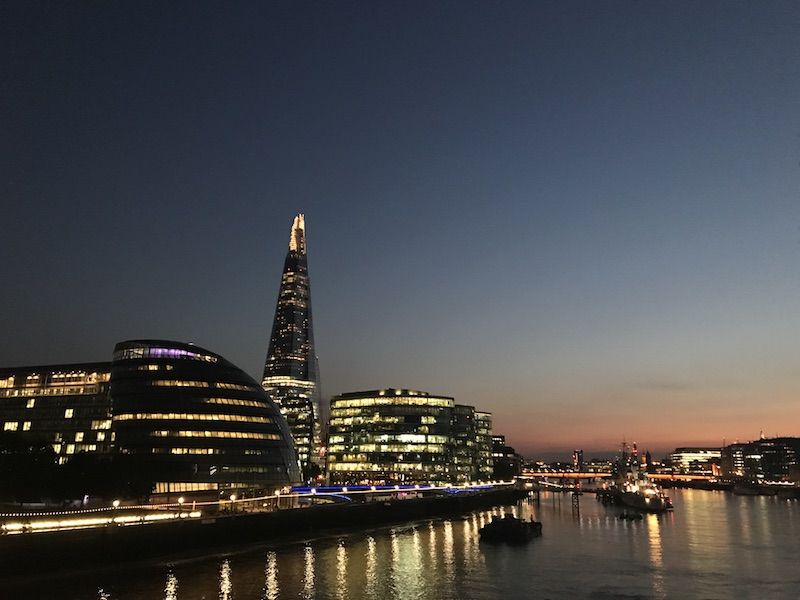

In [15]:
 display_array(content)

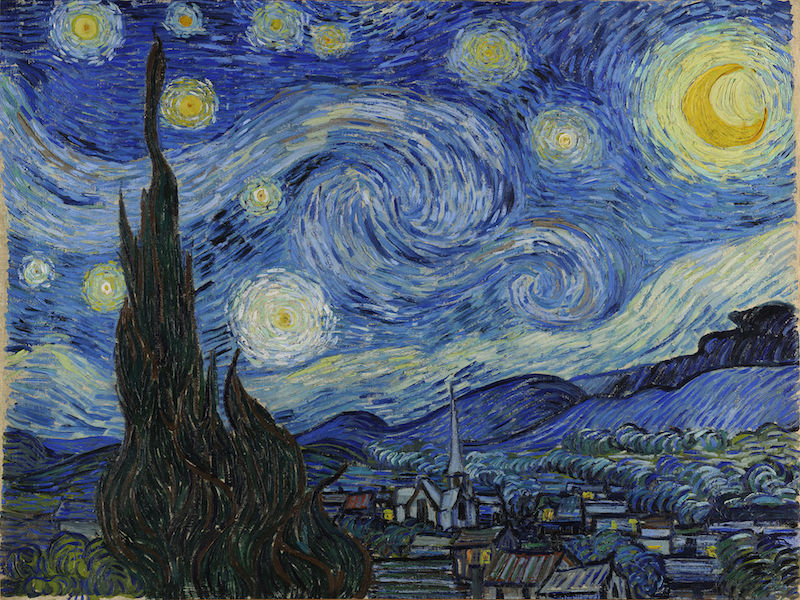

In [16]:
display_array(style)

In [17]:
# compute layer activations for content
g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:
    content_pre = np.array([network_model.preprocess(content)])

    image = tf.placeholder('float', shape=content_pre.shape)
    model = network_model.get_model(image)
    content_out = sess.run(model[content_layer], feed_dict = {image:content_pre})

In [18]:
# compute layer activations for style
g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:
    style_pre = np.array([network_model.preprocess(style)])
    image = tf.placeholder('float', shape=style_pre.shape)
    model = network_model.get_model(image)
    style_out = sess.run({s_l:model[s_l] for s_l in style_layer}, feed_dict = {image:style_pre})

In [19]:
now = datetime.utcnow().strftime("%Y-%m-%d_%H-%M-%S")
logdir = "logs"

Iteration 1/1000
total loss: 7.54694e+11


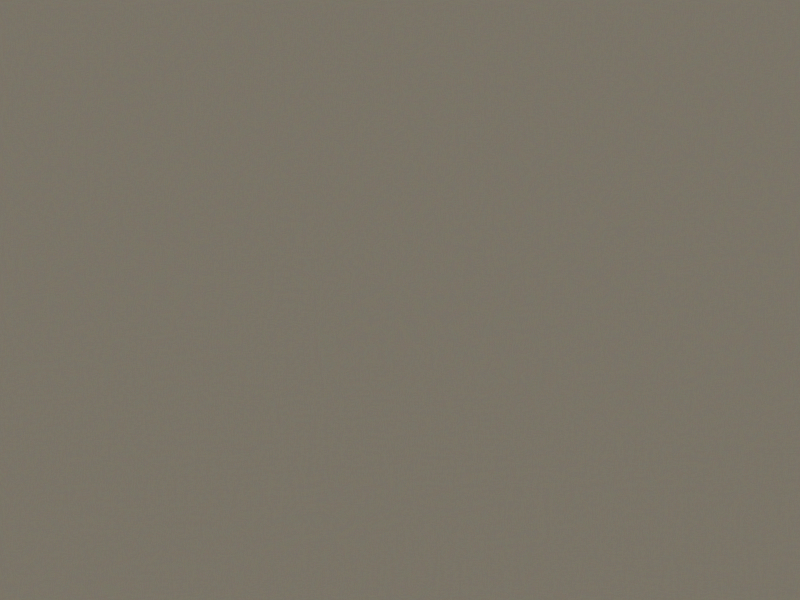

Iteration 2/1000
Iteration 3/1000
Iteration 4/1000
Iteration 5/1000
Iteration 6/1000
Iteration 7/1000
Iteration 8/1000
Iteration 9/1000
Iteration 10/1000
Iteration 11/1000
Iteration 12/1000
Iteration 13/1000
Iteration 14/1000
Iteration 15/1000
Iteration 16/1000
Iteration 17/1000
Iteration 18/1000
Iteration 19/1000
Iteration 20/1000
Iteration 21/1000
Iteration 22/1000
Iteration 23/1000
Iteration 24/1000
Iteration 25/1000
Iteration 26/1000
Iteration 27/1000
Iteration 28/1000
Iteration 29/1000
Iteration 30/1000
Iteration 31/1000
Iteration 32/1000
Iteration 33/1000
Iteration 34/1000
Iteration 35/1000
Iteration 36/1000
Iteration 37/1000
Iteration 38/1000
Iteration 39/1000
Iteration 40/1000
Iteration 41/1000
Iteration 42/1000
Iteration 43/1000
Iteration 44/1000
Iteration 45/1000
Iteration 46/1000
Iteration 47/1000
Iteration 48/1000
Iteration 49/1000
Iteration 50/1000
Iteration 51/1000
Iteration 52/1000
Iteration 53/1000
Iteration 54/1000
Iteration 55/1000
Iteration 56/1000
Iteration 57/1000


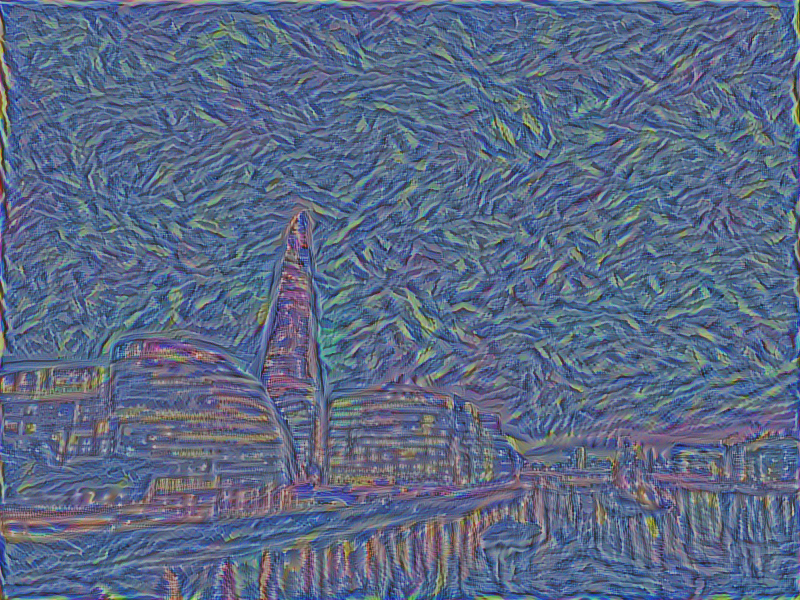

Iteration 102/1000
Iteration 103/1000
Iteration 104/1000
Iteration 105/1000
Iteration 106/1000
Iteration 107/1000
Iteration 108/1000
Iteration 109/1000
Iteration 110/1000
Iteration 111/1000
Iteration 112/1000
Iteration 113/1000
Iteration 114/1000
Iteration 115/1000
Iteration 116/1000
Iteration 117/1000
Iteration 118/1000
Iteration 119/1000
Iteration 120/1000
Iteration 121/1000
Iteration 122/1000
Iteration 123/1000
Iteration 124/1000
Iteration 125/1000
Iteration 126/1000
Iteration 127/1000
Iteration 128/1000
Iteration 129/1000
Iteration 130/1000
Iteration 131/1000
Iteration 132/1000
Iteration 133/1000
Iteration 134/1000
Iteration 135/1000
Iteration 136/1000
Iteration 137/1000
Iteration 138/1000
Iteration 139/1000
Iteration 140/1000
Iteration 141/1000
Iteration 142/1000
Iteration 143/1000
Iteration 144/1000
Iteration 145/1000
Iteration 146/1000
Iteration 147/1000
Iteration 148/1000
Iteration 149/1000
Iteration 150/1000
Iteration 151/1000
Iteration 152/1000
Iteration 153/1000
Iteration 15

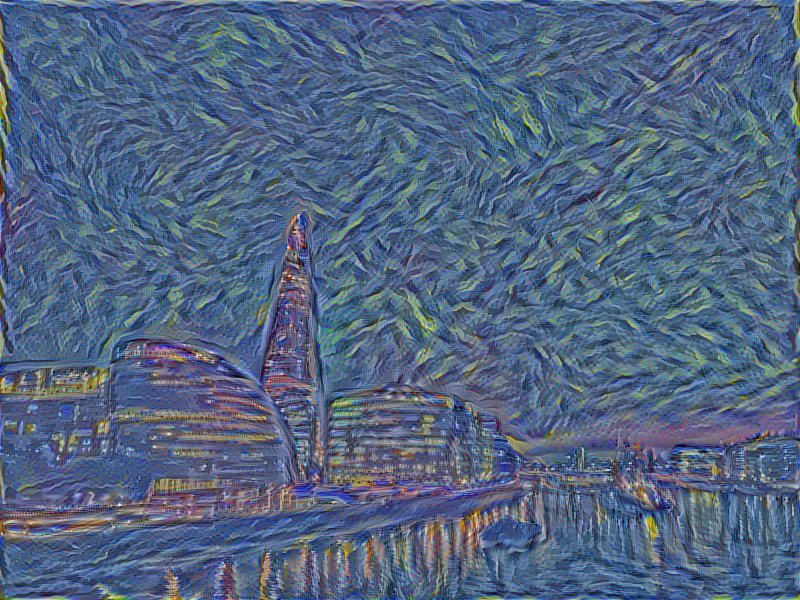

Iteration 202/1000
Iteration 203/1000
Iteration 204/1000
Iteration 205/1000
Iteration 206/1000
Iteration 207/1000
Iteration 208/1000
Iteration 209/1000
Iteration 210/1000
Iteration 211/1000
Iteration 212/1000
Iteration 213/1000
Iteration 214/1000
Iteration 215/1000
Iteration 216/1000
Iteration 217/1000
Iteration 218/1000
Iteration 219/1000
Iteration 220/1000
Iteration 221/1000
Iteration 222/1000
Iteration 223/1000
Iteration 224/1000
Iteration 225/1000
Iteration 226/1000
Iteration 227/1000
Iteration 228/1000
Iteration 229/1000
Iteration 230/1000
Iteration 231/1000
Iteration 232/1000
Iteration 233/1000
Iteration 234/1000
Iteration 235/1000
Iteration 236/1000
Iteration 237/1000
Iteration 238/1000
Iteration 239/1000
Iteration 240/1000
Iteration 241/1000
Iteration 242/1000
Iteration 243/1000
Iteration 244/1000
Iteration 245/1000
Iteration 246/1000
Iteration 247/1000
Iteration 248/1000
Iteration 249/1000
Iteration 250/1000
Iteration 251/1000
Iteration 252/1000
Iteration 253/1000
Iteration 25

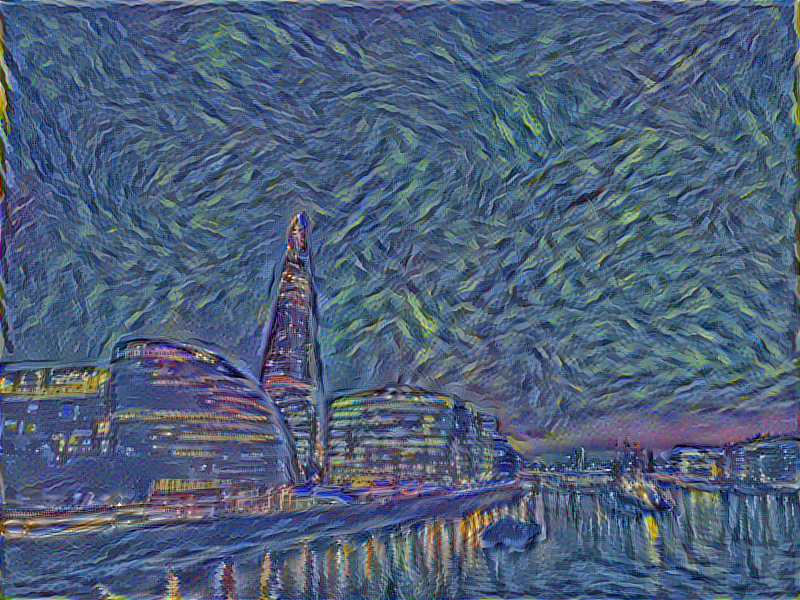

Iteration 302/1000
Iteration 303/1000
Iteration 304/1000
Iteration 305/1000
Iteration 306/1000
Iteration 307/1000
Iteration 308/1000
Iteration 309/1000
Iteration 310/1000
Iteration 311/1000
Iteration 312/1000
Iteration 313/1000
Iteration 314/1000
Iteration 315/1000
Iteration 316/1000
Iteration 317/1000
Iteration 318/1000
Iteration 319/1000
Iteration 320/1000
Iteration 321/1000
Iteration 322/1000
Iteration 323/1000
Iteration 324/1000
Iteration 325/1000
Iteration 326/1000
Iteration 327/1000
Iteration 328/1000
Iteration 329/1000
Iteration 330/1000
Iteration 331/1000
Iteration 332/1000
Iteration 333/1000
Iteration 334/1000
Iteration 335/1000
Iteration 336/1000
Iteration 337/1000
Iteration 338/1000
Iteration 339/1000
Iteration 340/1000
Iteration 341/1000
Iteration 342/1000
Iteration 343/1000
Iteration 344/1000
Iteration 345/1000
Iteration 346/1000
Iteration 347/1000
Iteration 348/1000
Iteration 349/1000
Iteration 350/1000
Iteration 351/1000
Iteration 352/1000
Iteration 353/1000
Iteration 35

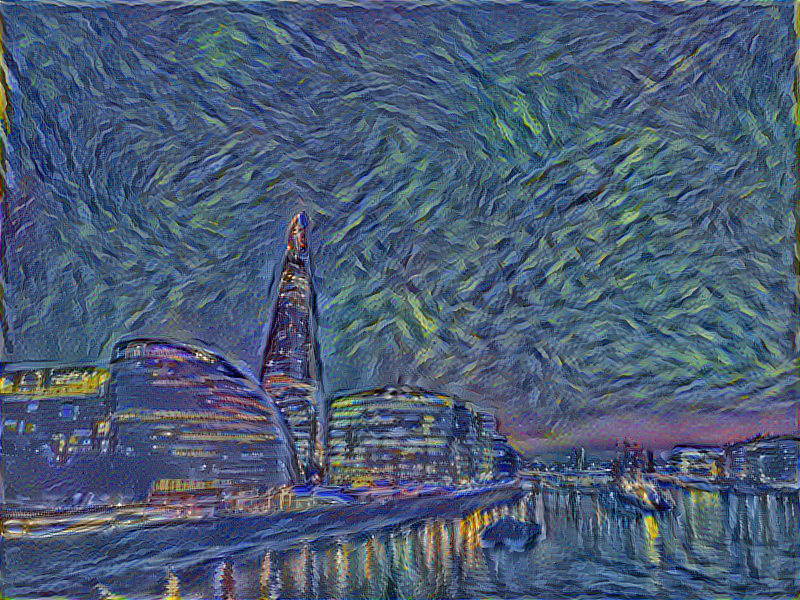

Iteration 402/1000
Iteration 403/1000
Iteration 404/1000
Iteration 405/1000
Iteration 406/1000
Iteration 407/1000
Iteration 408/1000
Iteration 409/1000
Iteration 410/1000
Iteration 411/1000
Iteration 412/1000
Iteration 413/1000
Iteration 414/1000
Iteration 415/1000
Iteration 416/1000
Iteration 417/1000
Iteration 418/1000
Iteration 419/1000
Iteration 420/1000
Iteration 421/1000
Iteration 422/1000
Iteration 423/1000
Iteration 424/1000
Iteration 425/1000
Iteration 426/1000
Iteration 427/1000
Iteration 428/1000
Iteration 429/1000
Iteration 430/1000
Iteration 431/1000
Iteration 432/1000
Iteration 433/1000
Iteration 434/1000
Iteration 435/1000
Iteration 436/1000
Iteration 437/1000
Iteration 438/1000
Iteration 439/1000
Iteration 440/1000
Iteration 441/1000
Iteration 442/1000
Iteration 443/1000
Iteration 444/1000
Iteration 445/1000
Iteration 446/1000
Iteration 447/1000
Iteration 448/1000
Iteration 449/1000
Iteration 450/1000
Iteration 451/1000
Iteration 452/1000
Iteration 453/1000
Iteration 45

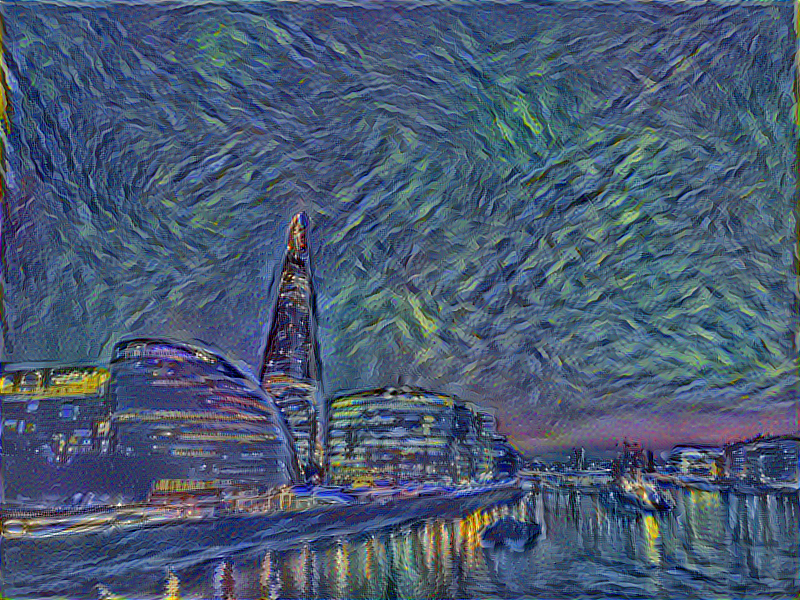

Iteration 502/1000
Iteration 503/1000
Iteration 504/1000
Iteration 505/1000
Iteration 506/1000
Iteration 507/1000
Iteration 508/1000
Iteration 509/1000
Iteration 510/1000
Iteration 511/1000
Iteration 512/1000
Iteration 513/1000
Iteration 514/1000
Iteration 515/1000
Iteration 516/1000
Iteration 517/1000
Iteration 518/1000
Iteration 519/1000
Iteration 520/1000
Iteration 521/1000
Iteration 522/1000
Iteration 523/1000
Iteration 524/1000
Iteration 525/1000
Iteration 526/1000
Iteration 527/1000
Iteration 528/1000
Iteration 529/1000
Iteration 530/1000
Iteration 531/1000
Iteration 532/1000
Iteration 533/1000
Iteration 534/1000
Iteration 535/1000
Iteration 536/1000
Iteration 537/1000
Iteration 538/1000
Iteration 539/1000
Iteration 540/1000
Iteration 541/1000
Iteration 542/1000
Iteration 543/1000
Iteration 544/1000
Iteration 545/1000
Iteration 546/1000
Iteration 547/1000
Iteration 548/1000
Iteration 549/1000
Iteration 550/1000
Iteration 551/1000
Iteration 552/1000
Iteration 553/1000
Iteration 55

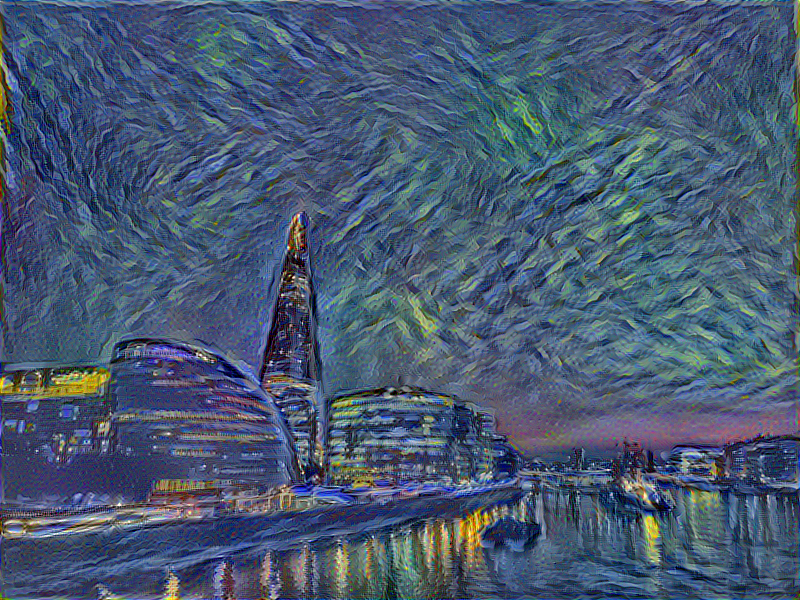

Iteration 602/1000
Iteration 603/1000
Iteration 604/1000
Iteration 605/1000
Iteration 606/1000
Iteration 607/1000
Iteration 608/1000
Iteration 609/1000
Iteration 610/1000
Iteration 611/1000
Iteration 612/1000
Iteration 613/1000
Iteration 614/1000
Iteration 615/1000
Iteration 616/1000
Iteration 617/1000
Iteration 618/1000
Iteration 619/1000
Iteration 620/1000
Iteration 621/1000
Iteration 622/1000
Iteration 623/1000
Iteration 624/1000
Iteration 625/1000
Iteration 626/1000
Iteration 627/1000
Iteration 628/1000
Iteration 629/1000
Iteration 630/1000
Iteration 631/1000
Iteration 632/1000
Iteration 633/1000
Iteration 634/1000
Iteration 635/1000
Iteration 636/1000
Iteration 637/1000
Iteration 638/1000
Iteration 639/1000
Iteration 640/1000
Iteration 641/1000
Iteration 642/1000
Iteration 643/1000
Iteration 644/1000
Iteration 645/1000
Iteration 646/1000
Iteration 647/1000
Iteration 648/1000
Iteration 649/1000
Iteration 650/1000
Iteration 651/1000
Iteration 652/1000
Iteration 653/1000
Iteration 65

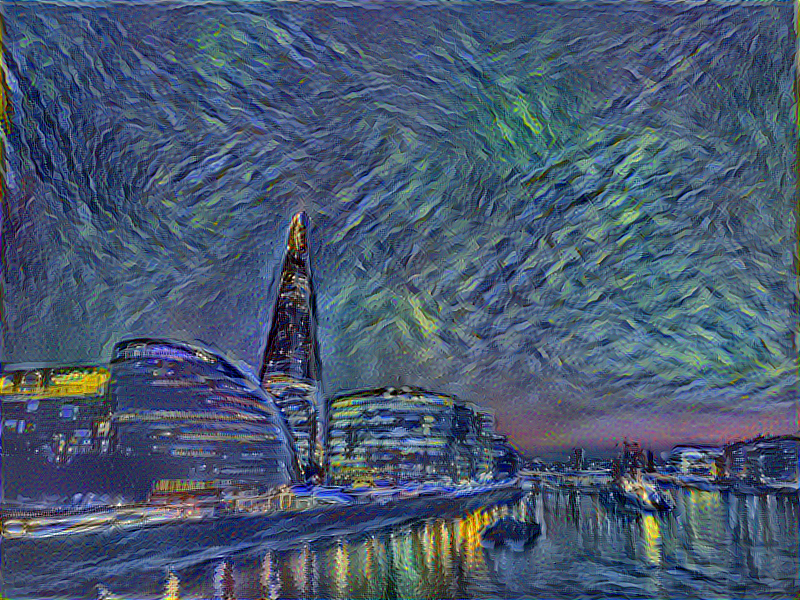

Iteration 702/1000
Iteration 703/1000
Iteration 704/1000
Iteration 705/1000
Iteration 706/1000
Iteration 707/1000
Iteration 708/1000
Iteration 709/1000
Iteration 710/1000
Iteration 711/1000
Iteration 712/1000
Iteration 713/1000
Iteration 714/1000
Iteration 715/1000
Iteration 716/1000
Iteration 717/1000
Iteration 718/1000
Iteration 719/1000
Iteration 720/1000
Iteration 721/1000
Iteration 722/1000
Iteration 723/1000
Iteration 724/1000
Iteration 725/1000
Iteration 726/1000
Iteration 727/1000
Iteration 728/1000
Iteration 729/1000
Iteration 730/1000
Iteration 731/1000
Iteration 732/1000
Iteration 733/1000
Iteration 734/1000
Iteration 735/1000
Iteration 736/1000
Iteration 737/1000
Iteration 738/1000
Iteration 739/1000
Iteration 740/1000
Iteration 741/1000
Iteration 742/1000
Iteration 743/1000
Iteration 744/1000
Iteration 745/1000
Iteration 746/1000
Iteration 747/1000
Iteration 748/1000
Iteration 749/1000
Iteration 750/1000
Iteration 751/1000
Iteration 752/1000
Iteration 753/1000
Iteration 75

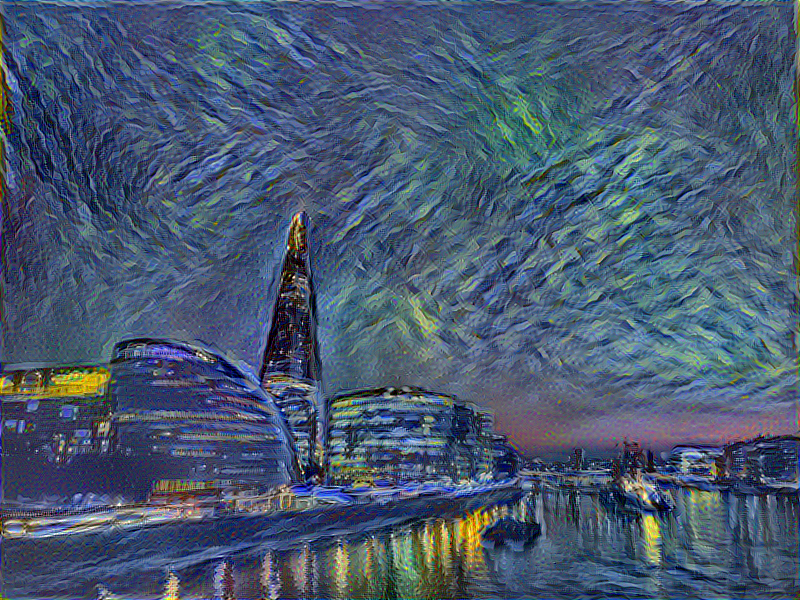

Iteration 802/1000
Iteration 803/1000
Iteration 804/1000
Iteration 805/1000
Iteration 806/1000
Iteration 807/1000
Iteration 808/1000
Iteration 809/1000
Iteration 810/1000
Iteration 811/1000
Iteration 812/1000
Iteration 813/1000
Iteration 814/1000
Iteration 815/1000
Iteration 816/1000
Iteration 817/1000
Iteration 818/1000
Iteration 819/1000
Iteration 820/1000
Iteration 821/1000
Iteration 822/1000
Iteration 823/1000
Iteration 824/1000
Iteration 825/1000
Iteration 826/1000
Iteration 827/1000
Iteration 828/1000
Iteration 829/1000
Iteration 830/1000
Iteration 831/1000
Iteration 832/1000
Iteration 833/1000
Iteration 834/1000
Iteration 835/1000
Iteration 836/1000
Iteration 837/1000
Iteration 838/1000
Iteration 839/1000
Iteration 840/1000
Iteration 841/1000
Iteration 842/1000
Iteration 843/1000
Iteration 844/1000
Iteration 845/1000
Iteration 846/1000
Iteration 847/1000
Iteration 848/1000
Iteration 849/1000
Iteration 850/1000
Iteration 851/1000
Iteration 852/1000
Iteration 853/1000
Iteration 85

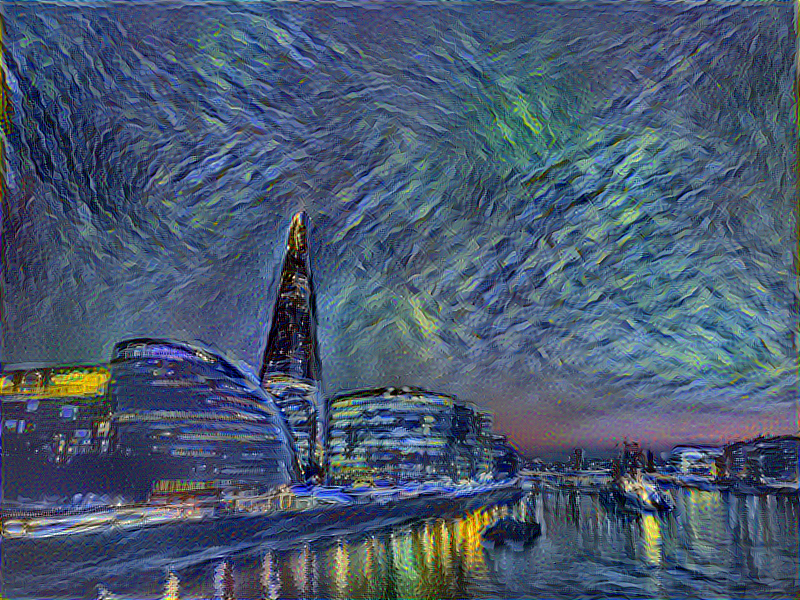

Iteration 902/1000
Iteration 903/1000
Iteration 904/1000
Iteration 905/1000
Iteration 906/1000
Iteration 907/1000
Iteration 908/1000
Iteration 909/1000
Iteration 910/1000
Iteration 911/1000
Iteration 912/1000
Iteration 913/1000
Iteration 914/1000
Iteration 915/1000
Iteration 916/1000
Iteration 917/1000
Iteration 918/1000
Iteration 919/1000
Iteration 920/1000
Iteration 921/1000
Iteration 922/1000
Iteration 923/1000
Iteration 924/1000
Iteration 925/1000
Iteration 926/1000
Iteration 927/1000
Iteration 928/1000
Iteration 929/1000
Iteration 930/1000
Iteration 931/1000
Iteration 932/1000
Iteration 933/1000
Iteration 934/1000
Iteration 935/1000
Iteration 936/1000
Iteration 937/1000
Iteration 938/1000
Iteration 939/1000
Iteration 940/1000
Iteration 941/1000
Iteration 942/1000
Iteration 943/1000
Iteration 944/1000
Iteration 945/1000
Iteration 946/1000
Iteration 947/1000
Iteration 948/1000
Iteration 949/1000
Iteration 950/1000
Iteration 951/1000
Iteration 952/1000
Iteration 953/1000
Iteration 95

In [20]:
g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:
    # init randomly
    # white noise
    target = tf.random_normal((1,)+content.shape)

    target_pre_var = tf.Variable(target)

    # build model with empty layer activations for generated target image
    model = network_model.get_model(target_pre_var)

    # compute loss
    cont_cost = content_loss(content_out, model, content_layer, content_weight)
    style_cost = style_loss(style_out, model, style_layer, style_weight_layer)
    tv_cost = total_var_loss(target_pre_var, tv_weight)

    total_loss = cont_cost + tf.add_n(style_cost) + tv_cost

    train_step = tf.train.AdamOptimizer(learning_rate).minimize(total_loss)

    sess.run(tf.global_variables_initializer())
    min_loss = float("inf")
    best = None
    for step in range(iterations):
        train_step.run()
        print('Iteration %d/%d' % (step + 1, iterations))

        if step % 100 == 0:
            loss = total_loss.eval()
            print('total loss: %g' % total_loss.eval())
            if(loss < min_loss):
                min_loss = loss
                best = target_pre_var.eval()
                with_style = best.squeeze()
                with_style = network_model.postprocess(with_style)
                with_style = np.clip(with_style, 0, 255).astype(np.uint8)
                display_array(with_style)

    print('content loss: %g' % cont_cost.eval())
    print('style loss: %g' % tf.add_n(style_cost).eval())
    print('tv loss: %g' % tv_cost.eval())
    print('total loss: %g' % total_loss.eval())

In [21]:
with_style = best
with_style = with_style.squeeze()
with_style = network_model.postprocess(with_style)
with_style = np.clip(with_style, 0, 255).astype(np.uint8)

NameError: name 'final' is not defined

In [ ]:
display_array(with_style)